In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 14.7 MB/s eta 0:00:00


In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 39.8 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-0.6109, -0.7137, -0.5596,  ..., -1.6555, -1.7925, -1.8782],
         [-0.1999, -0.6281, -0.8335,  ..., -1.8268, -1.4843, -1.3815],
         [-0.6452, -0.5253, -0.8678,  ..., -1.5699, -1.5870, -1.5357],
         ...,
         [-0.6794, -0.3883, -0.6109,  ..., -1.4672, -1.4500, -1.1075],
         [ 0.2796,  0.0569,  0.0227,  ..., -1.5357, -0.9705, -1.1247],
         [ 0.1426,  0.1083, -0.0287,  ..., -1.6213, -1.7925, -1.7412]],

        [[-0.7577, -0.3725, -0.8277,  ..., -1.2479, -0.9328, -1.4930],
         [-0.9153, -0.5476, -0.4076,  ..., -1.4230, -1.1429, -1.1253],
         [-0.7752, -0.6001, -0.8978,  ..., -1.1429, -1.4055, -1.2829],
         ...,
         [-0.2500, -0.4251, -0.3025,  ..., -1.2129, -0.8978, -0.9328],
         [ 0.0301,  0.0476,  0.1352,  ..., -1.0728, -0.8452, -0.9503],
         [ 0.2927,  0.2752,  0.1527,  ..., -1.2304, -1.2129, -1.6681]],

        [[-0.2532, -0.6367, -0.7238,  ..., -1.5256, -1.1944, -1.0724],
         [-0.9504, -0.4275, -0.5670,  ..., -1

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        ...,
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 1, 1, 1],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3, self).__init__()
        self.base_model = smp.DeepLabV3(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 19.5 MB/s eta 0:00:00


In [27]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 9)

[I 2025-11-16 12:43:26,372] A new study created in memory with name: no-name-774dc4b5-7555-473a-9e16-dc80e56ee654


Trial 0: scheduler = reducelr, dice weight = 0.0, focal weight = 1.0



100%|██████████| 18/18 [00:27<00:00,  1.54s/it]


Epoch 1/25:
Train loss: 0.04405250565873252, Train Avg IoU: 0.36080316744132046



100%|██████████| 3/3 [00:01<00:00,  2.18it/s]


Val loss: 0.04143155366182327, Val Avg IoU: 0.5002957945596624



100%|██████████| 18/18 [00:23<00:00,  1.33s/it]


Epoch 2/25:
Train loss: 0.03770096662143866, Train Avg IoU: 0.5671444799348436



100%|██████████| 3/3 [00:01<00:00,  2.21it/s]


Val loss: 0.03388526663184166, Val Avg IoU: 0.6681069190703312



100%|██████████| 18/18 [00:24<00:00,  1.34s/it]


Epoch 3/25:
Train loss: 0.032150624319911, Train Avg IoU: 0.6655705549369147



100%|██████████| 3/3 [00:01<00:00,  2.18it/s]


Val loss: 0.02745681380232175, Val Avg IoU: 0.7565384010520108



100%|██████████| 18/18 [00:24<00:00,  1.36s/it]


Epoch 4/25:
Train loss: 0.0310071324929595, Train Avg IoU: 0.665899200665395



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.0335445428888003, Val Avg IoU: 0.6187949759255241



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 5/25:
Train loss: 0.028543675732281473, Train Avg IoU: 0.693647054509954



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.023606775949398678, Val Avg IoU: 0.8000789417962885



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.02665343104551236, Train Avg IoU: 0.719454395368223



100%|██████████| 3/3 [00:01<00:00,  2.17it/s]


Val loss: 0.023304292932152748, Val Avg IoU: 0.7828403217893757



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 7/25:
Train loss: 0.024807248471511736, Train Avg IoU: 0.7496983275119029



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.02149950961271922, Val Avg IoU: 0.8156209448806653



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 8/25:
Train loss: 0.022957270964980125, Train Avg IoU: 0.7808279786640018



100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


Val loss: 0.023376087347666424, Val Avg IoU: 0.7768694826950183



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 9/25:
Train loss: 0.02506517380889919, Train Avg IoU: 0.7480501458397266



100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


Val loss: 0.021055581669012707, Val Avg IoU: 0.8177814303235779



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 10/25:
Train loss: 0.021808337937626574, Train Avg IoU: 0.7873197555795708



100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


Val loss: 0.02003662350277106, Val Avg IoU: 0.8278472191587736



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 11/25:
Train loss: 0.02119963036643134, Train Avg IoU: 0.7995685276000725



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.019507513071099918, Val Avg IoU: 0.8340732917979765



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.020976130333211686, Train Avg IoU: 0.8025474101920521



100%|██████████| 3/3 [00:01<00:00,  2.16it/s]


Val loss: 0.01930726319551468, Val Avg IoU: 0.8334652938257477



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 13/25:
Train loss: 0.01996753592458036, Train Avg IoU: 0.8122413822413469



100%|██████████| 3/3 [00:01<00:00,  1.61it/s]


Val loss: 0.01887487682203452, Val Avg IoU: 0.8372615173445608



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 14/25:
Train loss: 0.019981375740220148, Train Avg IoU: 0.813217290765238



100%|██████████| 3/3 [00:01<00:00,  1.97it/s]


Val loss: 0.01845722955962022, Val Avg IoU: 0.8374137509870513



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.01998685248610046, Train Avg IoU: 0.8107111137816825



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.01818101480603218, Val Avg IoU: 0.8289915663593866



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 16/25:
Train loss: 0.021849401088224515, Train Avg IoU: 0.7884568229693107



100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


Val loss: 0.018244083349903423, Val Avg IoU: 0.8365075293810641



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.02035652230390244, Train Avg IoU: 0.8114886148776032



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.01827492192387581, Val Avg IoU: 0.8394206429080758



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 18/25:
Train loss: 0.01912774093863037, Train Avg IoU: 0.813108529366374



100%|██████████| 3/3 [00:01<00:00,  2.16it/s]


Val loss: 0.01799887605011463, Val Avg IoU: 0.8386612626496405



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.01888499217521813, Train Avg IoU: 0.8207451871633274



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.01724345547457536, Val Avg IoU: 0.8459978878351841



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.018244436631600063, Train Avg IoU: 0.8262934642012736



100%|██████████| 3/3 [00:01<00:00,  2.17it/s]


Val loss: 0.017927095604439575, Val Avg IoU: 0.8382437597232598



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.017822048005958397, Train Avg IoU: 0.8280773750975172



100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


Val loss: 0.01751017663627863, Val Avg IoU: 0.8405982336915603



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 22/25:
Train loss: 0.01850075072919329, Train Avg IoU: 0.8200599597190507



100%|██████████| 3/3 [00:01<00:00,  2.17it/s]


Val loss: 0.016987052746117115, Val Avg IoU: 0.8437115721856431



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 23/25:
Train loss: 0.017856766728477344, Train Avg IoU: 0.8275707021286871



100%|██████████| 3/3 [00:01<00:00,  2.15it/s]


Val loss: 0.017346760568519432, Val Avg IoU: 0.8354423680508422



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 24/25:
Train loss: 0.017255781839291256, Train Avg IoU: 0.8297242893815874



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.017289108286301296, Val Avg IoU: 0.8401382034945036



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.01786181837734249, Train Avg IoU: 0.8197434940688583



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]
[I 2025-11-16 12:54:29,438] Trial 0 finished with value: 0.016987052746117115 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.0, 1.0)}. Best is trial 0 with value: 0.016987052746117115.


Val loss: 0.01737532950937748, Val Avg IoU: 0.8405006198563935

Trial 1: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 1/25:
Train loss: 0.17485782669650185, Train Avg IoU: 0.46779921988202905



100%|██████████| 3/3 [00:01<00:00,  1.61it/s]


Val loss: 0.14631457130114237, Val Avg IoU: 0.5487072308179598



100%|██████████| 18/18 [00:25<00:00,  1.43s/it]


Epoch 2/25:
Train loss: 0.15443617271052468, Train Avg IoU: 0.5568852698090366



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.13049502422412237, Val Avg IoU: 0.6576854580503678



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.14056474591294923, Train Avg IoU: 0.6530252230357393



100%|██████████| 3/3 [00:01<00:00,  2.13it/s]


Val loss: 0.12272871534029643, Val Avg IoU: 0.6891597863407327



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 4/25:
Train loss: 0.1301853424972958, Train Avg IoU: 0.7006852403687684



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.1154308021068573, Val Avg IoU: 0.7195309200720708



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.12316189623541302, Train Avg IoU: 0.7212967910782685



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.10588646680116653, Val Avg IoU: 0.786955743935156



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.11986583015984958, Train Avg IoU: 0.7364325481326249



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.10196359207232793, Val Avg IoU: 0.7914333612413529



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.11188890867763096, Train Avg IoU: 0.7739765340163609



100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


Val loss: 0.09756432722012202, Val Avg IoU: 0.806247757908093



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 8/25:
Train loss: 0.10899982642796305, Train Avg IoU: 0.7767605566498574



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.09219394872585933, Val Avg IoU: 0.8252674729866438



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.10357940238383082, Train Avg IoU: 0.8062532039517659



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.08983638137578964, Val Avg IoU: 0.8313907316347416



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.10069732202423944, Train Avg IoU: 0.8077356626358785



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.08834031224250793, Val Avg IoU: 0.8329724937725222



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.09833984283937348, Train Avg IoU: 0.8130132996357707



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.08682624002297719, Val Avg IoU: 0.8357363731056835



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.09596364738212691, Train Avg IoU: 0.8172194462425815



100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


Val loss: 0.08533400545517604, Val Avg IoU: 0.8415280866493003



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.09483903273940086, Train Avg IoU: 0.8194253478768587



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.08441054821014404, Val Avg IoU: 0.8403978779641866



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.09365185722708702, Train Avg IoU: 0.8200546889863806



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.08459087709585826, Val Avg IoU: 0.8367776031105337



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 15/25:
Train loss: 0.09367278094093005, Train Avg IoU: 0.8214548740327559



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.08554986615975697, Val Avg IoU: 0.8276009134393686



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 16/25:
Train loss: 0.09419756879409154, Train Avg IoU: 0.8163607843263504



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.08368159085512161, Val Avg IoU: 0.8381644018651183



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.09382966947224405, Train Avg IoU: 0.8223531010839996



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.08167895426352818, Val Avg IoU: 0.8441937843783256



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.09040105135904418, Train Avg IoU: 0.8237292816382156



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.08195569862922032, Val Avg IoU: 0.844024294117682



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 19/25:
Train loss: 0.09182810576425658, Train Avg IoU: 0.8190231205523316



100%|██████████| 3/3 [00:01<00:00,  1.76it/s]


Val loss: 0.0818265328804652, Val Avg IoU: 0.842560284244534



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.09159148277507888, Train Avg IoU: 0.8228164494055988



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.0805794894695282, Val Avg IoU: 0.8472462891294308



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.09134515292114681, Train Avg IoU: 0.8309827469101436



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.08076324810584386, Val Avg IoU: 0.845535295648172



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.09111153624123997, Train Avg IoU: 0.8279329042219835



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.0805665949980418, Val Avg IoU: 0.8466651549061935



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.08975359756085607, Train Avg IoU: 0.8314704507481104



100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


Val loss: 0.08047038813432057, Val Avg IoU: 0.8468070824367078



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 24/25:
Train loss: 0.09010652038786146, Train Avg IoU: 0.8307955437621578



100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


Val loss: 0.08041523396968842, Val Avg IoU: 0.8467255688258462



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.09009066513843006, Train Avg IoU: 0.8294590723744386



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]
[I 2025-11-16 13:05:33,423] Trial 1 finished with value: 0.08039127290248871 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.016987052746117115.


Val loss: 0.08039127290248871, Val Avg IoU: 0.84686030145854

Trial 2: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 1/25:
Train loss: 0.17452592733833525, Train Avg IoU: 0.4846631943479685



100%|██████████| 3/3 [00:01<00:00,  1.97it/s]


Val loss: 0.1504593938589096, Val Avg IoU: 0.580362504906363



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 2/25:
Train loss: 0.15854511078861025, Train Avg IoU: 0.5385364604641211



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.1340763916571935, Val Avg IoU: 0.6208310765710371



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 3/25:
Train loss: 0.14234602037403318, Train Avg IoU: 0.6393183204521109



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.11610753337542216, Val Avg IoU: 0.7680260217516315



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 4/25:
Train loss: 0.12937753481997383, Train Avg IoU: 0.7224171119826541



100%|██████████| 3/3 [00:01<00:00,  1.93it/s]


Val loss: 0.11174418777227402, Val Avg IoU: 0.7737582364162675



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 5/25:
Train loss: 0.12186863645911217, Train Avg IoU: 0.7527320142124834



100%|██████████| 3/3 [00:01<00:00,  1.95it/s]


Val loss: 0.11558786282936732, Val Avg IoU: 0.7159427789410948



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 6/25:
Train loss: 0.11738036862677997, Train Avg IoU: 0.7486181321179833



100%|██████████| 3/3 [00:01<00:00,  1.71it/s]


Val loss: 0.1023647536834081, Val Avg IoU: 0.8068855577860337



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 7/25:
Train loss: 0.1131117083132267, Train Avg IoU: 0.7807608600236163



100%|██████████| 3/3 [00:01<00:00,  1.74it/s]


Val loss: 0.09834184249242146, Val Avg IoU: 0.8244167712777896



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 8/25:
Train loss: 0.10881841679414113, Train Avg IoU: 0.7964103992649659



100%|██████████| 3/3 [00:01<00:00,  1.57it/s]


Val loss: 0.09687024354934692, Val Avg IoU: 0.8203993224735409



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 9/25:
Train loss: 0.10718874343567425, Train Avg IoU: 0.796129265513699



100%|██████████| 3/3 [00:01<00:00,  1.88it/s]


Val loss: 0.09357638408740361, Val Avg IoU: 0.827694455435637



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 10/25:
Train loss: 0.10373436949319309, Train Avg IoU: 0.809381089090768



100%|██████████| 3/3 [00:01<00:00,  1.84it/s]


Val loss: 0.09250123550494511, Val Avg IoU: 0.8265211288963871



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 11/25:
Train loss: 0.1017684352894624, Train Avg IoU: 0.807661678380334



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.0898594136039416, Val Avg IoU: 0.8313777154527244



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.09880808037188318, Train Avg IoU: 0.8133716837076486



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.09472167988618214, Val Avg IoU: 0.7943831625766441



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.10122304865055615, Train Avg IoU: 0.7929140259732385



100%|██████████| 3/3 [00:02<00:00,  1.41it/s]


Val loss: 0.08540161699056625, Val Avg IoU: 0.8408170190064403



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 14/25:
Train loss: 0.10006990987393591, Train Avg IoU: 0.8038543607957154



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.08371126403411229, Val Avg IoU: 0.8414258215061338



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.09274190788467725, Train Avg IoU: 0.8215608638475013



100%|██████████| 3/3 [00:01<00:00,  1.94it/s]


Val loss: 0.08297724276781082, Val Avg IoU: 0.8390738921947452



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.09390216610497898, Train Avg IoU: 0.8199009322585343



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.0822449525197347, Val Avg IoU: 0.8381221275202498



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 17/25:
Train loss: 0.0912193829814593, Train Avg IoU: 0.8208431722412999



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.07957277446985245, Val Avg IoU: 0.8442544446908564



100%|██████████| 18/18 [00:26<00:00,  1.45s/it]


Epoch 18/25:
Train loss: 0.0975292751358615, Train Avg IoU: 0.7798754948743283



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.08423743893702824, Val Avg IoU: 0.8209369889309581



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 19/25:
Train loss: 0.0973039646115568, Train Avg IoU: 0.7839986865351287



100%|██████████| 3/3 [00:01<00:00,  2.11it/s]


Val loss: 0.08075296878814697, Val Avg IoU: 0.829981272497628



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 20/25:
Train loss: 0.09456226436628236, Train Avg IoU: 0.7927446197346012



100%|██████████| 3/3 [00:01<00:00,  2.12it/s]


Val loss: 0.07806408653656642, Val Avg IoU: 0.842652299890724



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.08893253116144074, Train Avg IoU: 0.8211827804923142



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.07610464096069336, Val Avg IoU: 0.8432072917396326



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.0849922535320123, Train Avg IoU: 0.8228357540255846



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.07493450492620468, Val Avg IoU: 0.844303806168598



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.10163769208722645, Train Avg IoU: 0.7591122006466509



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.09465470413366954, Val Avg IoU: 0.7591617447495757



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.09557787370350626, Train Avg IoU: 0.7787694495987144



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.08216456075509389, Val Avg IoU: 0.8249187561079928



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 25/25:
Train loss: 0.08693489556511243, Train Avg IoU: 0.8083952836011677



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]
[I 2025-11-16 13:16:44,954] Trial 2 finished with value: 0.07493450492620468 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.016987052746117115.


Val loss: 0.07526868333419164, Val Avg IoU: 0.8399283798812042

Trial 3: scheduler = reducelr, dice weight = 0.1, focal weight = 0.9



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 1/25:
Train loss: 0.09029455855488777, Train Avg IoU: 0.45335584436357823



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.08068374792734782, Val Avg IoU: 0.5318921255604391



100%|██████████| 18/18 [00:24<00:00,  1.37s/it]


Epoch 2/25:
Train loss: 0.08178312869535552, Train Avg IoU: 0.5133697818269034



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.07484592497348785, Val Avg IoU: 0.5434482256012818



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.07257972885337141, Train Avg IoU: 0.6305849252841297



100%|██████████| 3/3 [00:01<00:00,  1.99it/s]


Val loss: 0.06380515173077583, Val Avg IoU: 0.703239668099194



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 4/25:
Train loss: 0.06876904517412186, Train Avg IoU: 0.6770046727644494



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.05947055170933405, Val Avg IoU: 0.7431076167430947



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.06268284490538968, Train Avg IoU: 0.7369999407137232



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.05297995110352834, Val Avg IoU: 0.8011642402415623



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 6/25:
Train loss: 0.058487285756402545, Train Avg IoU: 0.7652092596553453



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.04878206054369608, Val Avg IoU: 0.8162840272482298



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.05440146662294865, Train Avg IoU: 0.777911895925347



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04707876965403557, Val Avg IoU: 0.8221316496459811



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 8/25:
Train loss: 0.05391962122586039, Train Avg IoU: 0.7813391772157806



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.046278562396764755, Val Avg IoU: 0.8264627661871705



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 9/25:
Train loss: 0.05214709146983094, Train Avg IoU: 0.7849468023564836



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04619661718606949, Val Avg IoU: 0.8158499755197663



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.05031884730690055, Train Avg IoU: 0.7934922337457494



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.0456152136127154, Val Avg IoU: 0.8160827295666123



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.05018999655213621, Train Avg IoU: 0.8025039685359627



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.04329612851142883, Val Avg IoU: 0.8363312172894716



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.04785034784840213, Train Avg IoU: 0.809641175844932



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.0442546916504701, Val Avg IoU: 0.8277676902210119



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.046188101172447205, Train Avg IoU: 0.818438842262483



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.041831161826848984, Val Avg IoU: 0.8431779828792018



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.047457096063428454, Train Avg IoU: 0.8148718860526527



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.043039082239071526, Val Avg IoU: 0.8276791204684472



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.046547305252816945, Train Avg IoU: 0.8097511780190625



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.041788055251042046, Val Avg IoU: 0.8343961011563074



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.04713863734569815, Train Avg IoU: 0.8042415596551904



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.04230853666861852, Val Avg IoU: 0.8297008860006275



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.045940503064129085, Train Avg IoU: 0.8151468621517514



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.042261749505996704, Val Avg IoU: 0.832345473037419



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.04659734417994817, Train Avg IoU: 0.8062660039722284



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.042919871707757316, Val Avg IoU: 0.8236332963144172



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.04662384341160456, Train Avg IoU: 0.8052345382328814



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.04018815606832504, Val Avg IoU: 0.8397839026022612



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.043317478564050466, Train Avg IoU: 0.8251611967448534



100%|██████████| 3/3 [00:01<00:00,  1.99it/s]


Val loss: 0.03941912452379862, Val Avg IoU: 0.8454742595303616



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 21/25:
Train loss: 0.04324448129369153, Train Avg IoU: 0.8254807768703148



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04092391952872276, Val Avg IoU: 0.8310568764044916



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.048867019514242806, Train Avg IoU: 0.7939542571431526



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.054897854725519814, Val Avg IoU: 0.768115248133857



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.05080991010699007, Train Avg IoU: 0.7753952227600183



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.0416317917406559, Val Avg IoU: 0.8300991972422093



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 24/25:
Train loss: 0.044993128834499255, Train Avg IoU: 0.8120543636374814



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.0414153424402078, Val Avg IoU: 0.8286798511897401



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 25/25:
Train loss: 0.043415682597292796, Train Avg IoU: 0.8202069679880982



100%|██████████| 3/3 [00:01<00:00,  1.84it/s]
[I 2025-11-16 13:27:49,321] Trial 3 finished with value: 0.03817817444602648 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.1, 0.9)}. Best is trial 0 with value: 0.016987052746117115.


Val loss: 0.03817817444602648, Val Avg IoU: 0.8453727170623405

Trial 4: scheduler = cosine, dice weight = 0.0, focal weight = 1.0



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 1/25:
Train loss: 0.046728486402167216, Train Avg IoU: 0.34388931501123676



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.04019408797224363, Val Avg IoU: 0.5383369632585365



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 2/25:
Train loss: 0.03867651936080721, Train Avg IoU: 0.5330526993075195



100%|██████████| 3/3 [00:01<00:00,  1.70it/s]


Val loss: 0.03536411250631014, Val Avg IoU: 0.5972436194457376



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 3/25:
Train loss: 0.033816607358555, Train Avg IoU: 0.6041939910116391



100%|██████████| 3/3 [00:01<00:00,  1.68it/s]


Val loss: 0.03185065339008967, Val Avg IoU: 0.6991166313900065



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 4/25:
Train loss: 0.030216634687450197, Train Avg IoU: 0.6965671400655897



100%|██████████| 3/3 [00:01<00:00,  1.83it/s]


Val loss: 0.026893690849343937, Val Avg IoU: 0.7264522969940798



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 5/25:
Train loss: 0.027215161360800266, Train Avg IoU: 0.7219080343873581



100%|██████████| 3/3 [00:01<00:00,  1.74it/s]


Val loss: 0.023167583470543224, Val Avg IoU: 0.7877107681507368



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 6/25:
Train loss: 0.02439122719483243, Train Avg IoU: 0.7631825027028976



100%|██████████| 3/3 [00:01<00:00,  1.89it/s]


Val loss: 0.020342613259951275, Val Avg IoU: 0.81673027855686



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 7/25:
Train loss: 0.02260800999485784, Train Avg IoU: 0.7764054989346051



100%|██████████| 3/3 [00:01<00:00,  1.86it/s]


Val loss: 0.019799207026759785, Val Avg IoU: 0.8243666104603129



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 8/25:
Train loss: 0.021401115796632238, Train Avg IoU: 0.7845325324108693



100%|██████████| 3/3 [00:02<00:00,  1.43it/s]


Val loss: 0.019266317288080852, Val Avg IoU: 0.821220400656251



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 9/25:
Train loss: 0.020454686859415636, Train Avg IoU: 0.7965561304366351



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.01878516376018524, Val Avg IoU: 0.8318465857550038



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.020576200137535732, Train Avg IoU: 0.7953983286682108



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.01967490961154302, Val Avg IoU: 0.8238426743455419



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.019016355896989506, Train Avg IoU: 0.8110238734635771



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.01844885324438413, Val Avg IoU: 0.8329552198900528



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 12/25:
Train loss: 0.019310602711306676, Train Avg IoU: 0.8090878780116353



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.018136844659845035, Val Avg IoU: 0.836439467518065



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 13/25:
Train loss: 0.019685700121853087, Train Avg IoU: 0.8062780972339046



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.017866849899291992, Val Avg IoU: 0.8410599525556326



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.018256772982163563, Train Avg IoU: 0.8208535544324644



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.017478846634427708, Val Avg IoU: 0.8429109156038078



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.01807289829270707, Train Avg IoU: 0.819190920451867



100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


Val loss: 0.017382432085772354, Val Avg IoU: 0.8422951423904704



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.01897375290799472, Train Avg IoU: 0.8075692410588312



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.017346683889627457, Val Avg IoU: 0.8429137755074084



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.018746948076619044, Train Avg IoU: 0.8052450637143408



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.017492642315725487, Val Avg IoU: 0.8415731429049421



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.018805576850556664, Train Avg IoU: 0.8122975312137111



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.017944967995087307, Val Avg IoU: 0.829611076712097



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.018360479424397152, Train Avg IoU: 0.8186091895278335



100%|██████████| 3/3 [00:01<00:00,  2.10it/s]


Val loss: 0.0174791378279527, Val Avg IoU: 0.8362939422865425



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.018208478732655447, Train Avg IoU: 0.8216149497202014



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.017055098277827103, Val Avg IoU: 0.8449044364268966



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.017999633215367794, Train Avg IoU: 0.8238604669511594



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.017029681553443272, Val Avg IoU: 0.8455981564931355



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.017641550136937037, Train Avg IoU: 0.823950850535184



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.017053999317189057, Val Avg IoU: 0.8454320660230549



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 23/25:
Train loss: 0.017744614846176572, Train Avg IoU: 0.8245884310963112



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.0169578588878115, Val Avg IoU: 0.8456888646817714



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.017665459567473993, Train Avg IoU: 0.8257102787678097



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.016965344548225403, Val Avg IoU: 0.8458722660856447



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.017112336069759395, Train Avg IoU: 0.8300558091172304



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]
[I 2025-11-16 13:38:58,749] Trial 4 finished with value: 0.0169578588878115 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.0, 1.0)}. Best is trial 4 with value: 0.0169578588878115.


Val loss: 0.016972406146426994, Val Avg IoU: 0.845867189482021

Trial 5: scheduler = steplr, dice weight = 0.0, focal weight = 1.0



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 1/25:
Train loss: 0.04509069791270627, Train Avg IoU: 0.4047633745097565



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.04078060512741407, Val Avg IoU: 0.4852848191463252



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 2/25:
Train loss: 0.03951705474820402, Train Avg IoU: 0.5145355145332808



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.0351754737397035, Val Avg IoU: 0.6113436675293945



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.03397718475510677, Train Avg IoU: 0.62702501434065



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.030214564874768257, Val Avg IoU: 0.7251153630011835



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 4/25:
Train loss: 0.029750456826554403, Train Avg IoU: 0.6989322644062193



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.026134944210449856, Val Avg IoU: 0.7717495570854475



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.029678217756251495, Train Avg IoU: 0.6975298758789618



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.024936512112617493, Val Avg IoU: 0.7912753167190466



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.02415810266716613, Train Avg IoU: 0.7675794956569005



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.021395021428664524, Val Avg IoU: 0.8176808420417009



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.023981649635566607, Train Avg IoU: 0.768312807050891



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.02036880950133006, Val Avg IoU: 0.8202606822733816



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 8/25:
Train loss: 0.023332058245109186, Train Avg IoU: 0.7596977574097294



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.021189380437135696, Val Avg IoU: 0.8070739298254792



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.02273515435970492, Train Avg IoU: 0.7674962097213727



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.022180325041214626, Val Avg IoU: 0.8024622358974217



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.021707765758037567, Train Avg IoU: 0.7870493934116451



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.018497128039598465, Val Avg IoU: 0.8311169544845399



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 11/25:
Train loss: 0.020054134333299264, Train Avg IoU: 0.8017391458140353



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.018769452969233196, Val Avg IoU: 0.8256071737689473



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.020348289878004126, Train Avg IoU: 0.7985703547837789



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.018200544640421867, Val Avg IoU: 0.8358933618965164



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.019654554263171222, Train Avg IoU: 0.8062471540756152



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.018101755529642105, Val Avg IoU: 0.834335390055882



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.019928978756070137, Train Avg IoU: 0.8021096071213268



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.01817505682508151, Val Avg IoU: 0.8299519990243324



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 15/25:
Train loss: 0.019824633478290506, Train Avg IoU: 0.7993784123508912



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.018374978254238766, Val Avg IoU: 0.8271771947810486



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.019288100198739104, Train Avg IoU: 0.807489086382577



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.017726310528814793, Val Avg IoU: 0.8388699629281261



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 17/25:
Train loss: 0.018958811441229448, Train Avg IoU: 0.8099492398544208



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.0175955177595218, Val Avg IoU: 0.8401435220783534



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.0191846861400538, Train Avg IoU: 0.8069166040755178



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.017565136775374413, Val Avg IoU: 0.8396498396376639



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.018779733632173803, Train Avg IoU: 0.8183350392275821



100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


Val loss: 0.017556697751084965, Val Avg IoU: 0.8387674546904248



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.01864894593341483, Train Avg IoU: 0.8169706221338852



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.017595725134015083, Val Avg IoU: 0.8377040315659608



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.018577262655728392, Train Avg IoU: 0.8144788940395523



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.017654426706333954, Val Avg IoU: 0.8398662266230925



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.01869920941276683, Train Avg IoU: 0.815026298332893



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]


Val loss: 0.017342410360773403, Val Avg IoU: 0.84159355232931



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.018068492723007996, Train Avg IoU: 0.8227050037240542



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.017360252017776173, Val Avg IoU: 0.8426101824327453



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.017999795989857778, Train Avg IoU: 0.8202708118694373



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.017385801300406456, Val Avg IoU: 0.84107048825146



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.017891230786012277, Train Avg IoU: 0.821149906348067



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]
[I 2025-11-16 13:50:02,940] Trial 5 finished with value: 0.017342410360773403 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.0, 1.0)}. Best is trial 4 with value: 0.0169578588878115.


Val loss: 0.017458087764680386, Val Avg IoU: 0.8413454236834422

Trial 6: scheduler = steplr, dice weight = 0.1, focal weight = 0.9



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 1/25:
Train loss: 0.08903282342685594, Train Avg IoU: 0.4076320842713899



100%|██████████| 3/3 [00:01<00:00,  1.92it/s]


Val loss: 0.07799455026785533, Val Avg IoU: 0.5751545741455885



100%|██████████| 18/18 [00:25<00:00,  1.43s/it]


Epoch 2/25:
Train loss: 0.07859366511305173, Train Avg IoU: 0.5768755953404379



100%|██████████| 3/3 [00:01<00:00,  1.89it/s]


Val loss: 0.07129489878813426, Val Avg IoU: 0.6065533814962061



100%|██████████| 18/18 [00:25<00:00,  1.43s/it]


Epoch 3/25:
Train loss: 0.06991377100348473, Train Avg IoU: 0.6659488369554416



100%|██████████| 3/3 [00:01<00:00,  1.96it/s]


Val loss: 0.059772003442049026, Val Avg IoU: 0.7420203877401995



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 4/25:
Train loss: 0.06466306952966584, Train Avg IoU: 0.702746177341226



100%|██████████| 3/3 [00:01<00:00,  1.93it/s]


Val loss: 0.0572405569255352, Val Avg IoU: 0.7558080771796855



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 5/25:
Train loss: 0.061103851430945925, Train Avg IoU: 0.7325511248222026



100%|██████████| 3/3 [00:01<00:00,  1.83it/s]


Val loss: 0.05149208133419355, Val Avg IoU: 0.8021753050064299



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 6/25:
Train loss: 0.05598130366868443, Train Avg IoU: 0.7638253081807974



100%|██████████| 3/3 [00:01<00:00,  1.83it/s]


Val loss: 0.05116221681237221, Val Avg IoU: 0.7961421411492889



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 7/25:
Train loss: 0.05528550119035774, Train Avg IoU: 0.7716229670565203



100%|██████████| 3/3 [00:01<00:00,  1.67it/s]


Val loss: 0.04789122690757116, Val Avg IoU: 0.8209770889882724



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 8/25:
Train loss: 0.05230885619918505, Train Avg IoU: 0.7943751131412623



100%|██████████| 3/3 [00:01<00:00,  1.68it/s]


Val loss: 0.048445653170347214, Val Avg IoU: 0.8125494072521177



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.051183204270071454, Train Avg IoU: 0.7985259124542099



100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


Val loss: 0.04640589654445648, Val Avg IoU: 0.8268396622877839



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.0509341632326444, Train Avg IoU: 0.8043975262706756



100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


Val loss: 0.045760673781236015, Val Avg IoU: 0.8293369178522774



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.04968004839287864, Train Avg IoU: 0.8098610100468575



100%|██████████| 3/3 [00:01<00:00,  1.75it/s]


Val loss: 0.0453484815855821, Val Avg IoU: 0.8316522883658223



100%|██████████| 18/18 [00:25<00:00,  1.43s/it]


Epoch 12/25:
Train loss: 0.050719663293825254, Train Avg IoU: 0.8009663657503081



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.04485426718990008, Val Avg IoU: 0.8352618095638565



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.04931333971520265, Train Avg IoU: 0.8065936457015042



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.045123559733231865, Val Avg IoU: 0.8310868073875333



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 14/25:
Train loss: 0.04978577606379986, Train Avg IoU: 0.8078017750249686



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04483416055639585, Val Avg IoU: 0.8327620888184534



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.04881357505089707, Train Avg IoU: 0.8142220229589126



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.04485929384827614, Val Avg IoU: 0.831885804257125



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.047580387650264636, Train Avg IoU: 0.8169259360539064



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.044486199816068016, Val Avg IoU: 0.8345552918572109



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.04747800384130743, Train Avg IoU: 0.8176414722768349



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.043876390904188156, Val Avg IoU: 0.8394547451212354



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 18/25:
Train loss: 0.048477544345789485, Train Avg IoU: 0.8158295686722736



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.04438855623205503, Val Avg IoU: 0.8330093142895866



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.04836419162650903, Train Avg IoU: 0.8121822640182386



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.04365720724066099, Val Avg IoU: 0.8402772289035928



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.04808316379785538, Train Avg IoU: 0.8212229690757713



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.044179790963729225, Val Avg IoU: 0.8331860268131859



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.04830582688252131, Train Avg IoU: 0.8182276602206372



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.04359626273314158, Val Avg IoU: 0.840009361815122



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 22/25:
Train loss: 0.04783504787418577, Train Avg IoU: 0.8181647638884862



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04359964902202288, Val Avg IoU: 0.839330479087503



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.046894320390290685, Train Avg IoU: 0.827110223234121



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.04348415012160937, Val Avg IoU: 0.8405294764772849



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 24/25:
Train loss: 0.04653697688546446, Train Avg IoU: 0.8264374807928925



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04349174723029137, Val Avg IoU: 0.8398023219636584



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.04701510340803199, Train Avg IoU: 0.8215708903625492



100%|██████████| 3/3 [00:01<00:00,  2.08it/s]
[I 2025-11-16 14:01:14,170] Trial 6 finished with value: 0.043447828541199364 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.1, 0.9)}. Best is trial 4 with value: 0.0169578588878115.


Val loss: 0.043447828541199364, Val Avg IoU: 0.8398925139355905

Trial 7: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 1/25:
Train loss: 0.17546999371714062, Train Avg IoU: 0.4557803622410981



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.15270902713139853, Val Avg IoU: 0.582661305705852



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 2/25:
Train loss: 0.15919928666618136, Train Avg IoU: 0.5579367931153622



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.13329531997442245, Val Avg IoU: 0.6752194981249073



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 3/25:
Train loss: 0.14258704334497452, Train Avg IoU: 0.6650373708706532



100%|██████████| 3/3 [00:01<00:00,  1.91it/s]


Val loss: 0.12242661664883296, Val Avg IoU: 0.7295509918000823



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 4/25:
Train loss: 0.13214852660894394, Train Avg IoU: 0.7104846909836736



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.11458599815766017, Val Avg IoU: 0.7703822331802185



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 5/25:
Train loss: 0.12175331513086955, Train Avg IoU: 0.7578904784616429



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.11059311280647914, Val Avg IoU: 0.7809522188881838



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.1239696563118034, Train Avg IoU: 0.7298883023239695



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.10925417641798656, Val Avg IoU: 0.7818283596358517



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 7/25:
Train loss: 0.11514303584893544, Train Avg IoU: 0.7773400332500808



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.10135367015997569, Val Avg IoU: 0.8168571714437509



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 8/25:
Train loss: 0.11166921589109632, Train Avg IoU: 0.792110205627718



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.10001207888126373, Val Avg IoU: 0.8168608675475015



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.10673311642474598, Train Avg IoU: 0.7963891142162021



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.09663884341716766, Val Avg IoU: 0.8291463233288764



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.1067855233947436, Train Avg IoU: 0.7980988935171724



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.09543563673893611, Val Avg IoU: 0.8291912431981076



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.10770884694324599, Train Avg IoU: 0.7969985064398054



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.09512117753426234, Val Avg IoU: 0.8283763106600066



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 12/25:
Train loss: 0.10564893815252516, Train Avg IoU: 0.8020633637695427



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.09473650654157002, Val Avg IoU: 0.8272647947326255



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 13/25:
Train loss: 0.10253224853012297, Train Avg IoU: 0.8134221560464184



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.09330139060815175, Val Avg IoU: 0.8328057314986879



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.10385506393180953, Train Avg IoU: 0.8035947446903



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.09274615347385406, Val Avg IoU: 0.8336891635174758



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.1016607176926401, Train Avg IoU: 0.8134736293100728



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.09224755316972733, Val Avg IoU: 0.8344072804708541



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.09950178116559982, Train Avg IoU: 0.8136556523395708



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.0920996442437172, Val Avg IoU: 0.8341348832315353



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.1008116565644741, Train Avg IoU: 0.809669771310592



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.09148581822713216, Val Avg IoU: 0.8356304136391867



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 18/25:
Train loss: 0.10105667635798454, Train Avg IoU: 0.8160630546067872



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.09117113550504048, Val Avg IoU: 0.8367950000649372



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.10076098061270183, Train Avg IoU: 0.8134123544332028



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.09084207564592361, Val Avg IoU: 0.8364573411703539



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 20/25:
Train loss: 0.10050137754943636, Train Avg IoU: 0.8150837959340382



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.09043595443169276, Val Avg IoU: 0.8385481572983595



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.10065180642737283, Train Avg IoU: 0.816369532365092



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.09085418035586675, Val Avg IoU: 0.8355180804724284



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.10003526591592365, Train Avg IoU: 0.8179245599407866



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.09018392115831375, Val Avg IoU: 0.8389048350417099



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.09926181824670897, Train Avg IoU: 0.8172548564140145



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.09021657208601634, Val Avg IoU: 0.8373563901663146



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.09874243951506084, Train Avg IoU: 0.8218770046644406



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.08996375153462093, Val Avg IoU: 0.8389039692301243



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.09651003612412347, Train Avg IoU: 0.8248220440244537



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]
[I 2025-11-16 14:12:18,122] Trial 7 finished with value: 0.08993198225895564 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 4 with value: 0.0169578588878115.


Val loss: 0.08993198225895564, Val Avg IoU: 0.8381067489003012

Trial 8: scheduler = cosine, dice weight = 0.1, focal weight = 0.9



100%|██████████| 18/18 [00:25<00:00,  1.41s/it]


Epoch 1/25:
Train loss: 0.0887052830722597, Train Avg IoU: 0.4488866760994288



100%|██████████| 3/3 [00:01<00:00,  1.98it/s]


Val loss: 0.07943531374136607, Val Avg IoU: 0.5149684686947744



100%|██████████| 18/18 [00:25<00:00,  1.43s/it]


Epoch 2/25:
Train loss: 0.08230903703305456, Train Avg IoU: 0.4866418665573883



100%|██████████| 3/3 [00:01<00:00,  1.74it/s]


Val loss: 0.07202130556106567, Val Avg IoU: 0.6077763033501425



100%|██████████| 18/18 [00:26<00:00,  1.47s/it]


Epoch 3/25:
Train loss: 0.07102167730530103, Train Avg IoU: 0.6411570144290848



100%|██████████| 3/3 [00:01<00:00,  1.67it/s]


Val loss: 0.06305756171544392, Val Avg IoU: 0.701428507838827



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 4/25:
Train loss: 0.0643688417557213, Train Avg IoU: 0.7102019325778473



100%|██████████| 3/3 [00:01<00:00,  1.77it/s]


Val loss: 0.05446953202287356, Val Avg IoU: 0.7920426049095299



100%|██████████| 18/18 [00:25<00:00,  1.42s/it]


Epoch 5/25:
Train loss: 0.058353116735816, Train Avg IoU: 0.7596100181070476



100%|██████████| 3/3 [00:01<00:00,  1.78it/s]


Val loss: 0.04761656994620959, Val Avg IoU: 0.8153207947122777



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 6/25:
Train loss: 0.052926693111658096, Train Avg IoU: 0.7856787237580015



100%|██████████| 3/3 [00:01<00:00,  1.79it/s]


Val loss: 0.04555763304233551, Val Avg IoU: 0.8262018939336199



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 7/25:
Train loss: 0.05156975073946847, Train Avg IoU: 0.7818295024249591



100%|██████████| 3/3 [00:01<00:00,  1.90it/s]


Val loss: 0.047440276791652046, Val Avg IoU: 0.8005170817326102



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 8/25:
Train loss: 0.05149170466595226, Train Avg IoU: 0.7803119212862261



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.045091563214858375, Val Avg IoU: 0.8189795502928084



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 9/25:
Train loss: 0.04865564778447151, Train Avg IoU: 0.8004988802637121



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04239316781361898, Val Avg IoU: 0.8347360023132592



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 10/25:
Train loss: 0.04675298660165734, Train Avg IoU: 0.8079171711504266



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.04291931043068568, Val Avg IoU: 0.8294985944708495



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 11/25:
Train loss: 0.04616822592086262, Train Avg IoU: 0.8102510452260395



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.04265000546971957, Val Avg IoU: 0.8270258189855508



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 12/25:
Train loss: 0.04586386556426684, Train Avg IoU: 0.8109373433349149



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.04151656975348791, Val Avg IoU: 0.8371947298194381



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 13/25:
Train loss: 0.04462592490017414, Train Avg IoU: 0.8203207433785942



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.04034824917713801, Val Avg IoU: 0.843723137081308



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 14/25:
Train loss: 0.0433147886974944, Train Avg IoU: 0.8285526401000493



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.04167748739322027, Val Avg IoU: 0.8269113723460418



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 15/25:
Train loss: 0.044650059193372726, Train Avg IoU: 0.8222780483580167



100%|██████████| 3/3 [00:01<00:00,  2.03it/s]


Val loss: 0.03980595121781031, Val Avg IoU: 0.8451390753880662



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 16/25:
Train loss: 0.04435115887059106, Train Avg IoU: 0.818156719266868



100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


Val loss: 0.03961202750603358, Val Avg IoU: 0.8453798461569448



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 17/25:
Train loss: 0.04356021972166167, Train Avg IoU: 0.8216984573346914



100%|██████████| 3/3 [00:01<00:00,  2.04it/s]


Val loss: 0.03961280112465223, Val Avg IoU: 0.845747900984072



100%|██████████| 18/18 [00:25<00:00,  1.40s/it]


Epoch 18/25:
Train loss: 0.042764382850792676, Train Avg IoU: 0.8288410114230171



100%|██████████| 3/3 [00:01<00:00,  1.69it/s]


Val loss: 0.03984960913658142, Val Avg IoU: 0.8403546289785501



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 19/25:
Train loss: 0.04311436518198914, Train Avg IoU: 0.8245817787028694



100%|██████████| 3/3 [00:01<00:00,  2.06it/s]


Val loss: 0.03957562645276388, Val Avg IoU: 0.8410363865820849



100%|██████████| 18/18 [00:24<00:00,  1.38s/it]


Epoch 20/25:
Train loss: 0.042991733385456934, Train Avg IoU: 0.829872641795032



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.03945452471574148, Val Avg IoU: 0.8422342966264614



100%|██████████| 18/18 [00:24<00:00,  1.39s/it]


Epoch 21/25:
Train loss: 0.04434907374282678, Train Avg IoU: 0.820521411337351



100%|██████████| 3/3 [00:01<00:00,  2.00it/s]


Val loss: 0.03971351434787115, Val Avg IoU: 0.8405520525438283



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 22/25:
Train loss: 0.04240828938782215, Train Avg IoU: 0.8330730048020446



100%|██████████| 3/3 [00:01<00:00,  2.07it/s]


Val loss: 0.03916065891583761, Val Avg IoU: 0.8454253752494258



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 23/25:
Train loss: 0.04275738799737559, Train Avg IoU: 0.8335614719714088



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]


Val loss: 0.039031690607468285, Val Avg IoU: 0.8463818096003798



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 24/25:
Train loss: 0.04164279066026211, Train Avg IoU: 0.8354407915845192



100%|██████████| 3/3 [00:01<00:00,  2.02it/s]


Val loss: 0.03898720070719719, Val Avg IoU: 0.8465810740253424



100%|██████████| 18/18 [00:25<00:00,  1.39s/it]


Epoch 25/25:
Train loss: 0.04311625866426362, Train Avg IoU: 0.8314867043981884



100%|██████████| 3/3 [00:01<00:00,  2.05it/s]
[I 2025-11-16 14:23:27,897] Trial 8 finished with value: 0.03898720070719719 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.1, 0.9)}. Best is trial 4 with value: 0.0169578588878115.


Val loss: 0.03899915392200152, Val Avg IoU: 0.8465955974177142



In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'cosine', 'loss_weight': (0.0, 1.0)}
Best val loss: 0.0169578588878115


In [31]:
fine_tune_model.eval()

CustomDeepLabV3(
  (base_model): DeepLabV3(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          

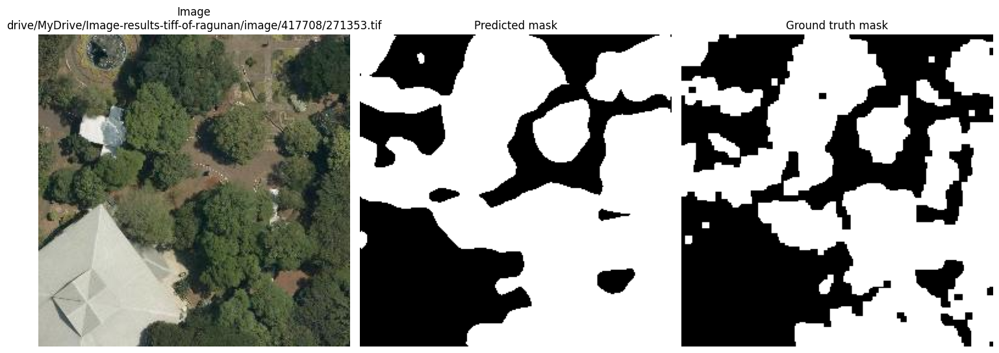

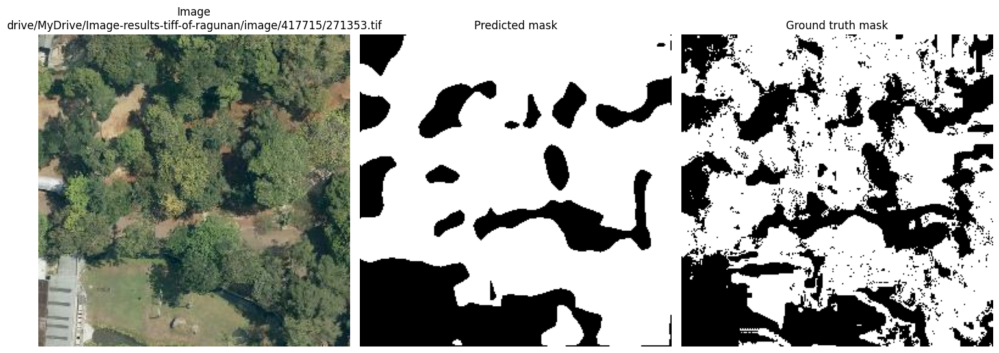

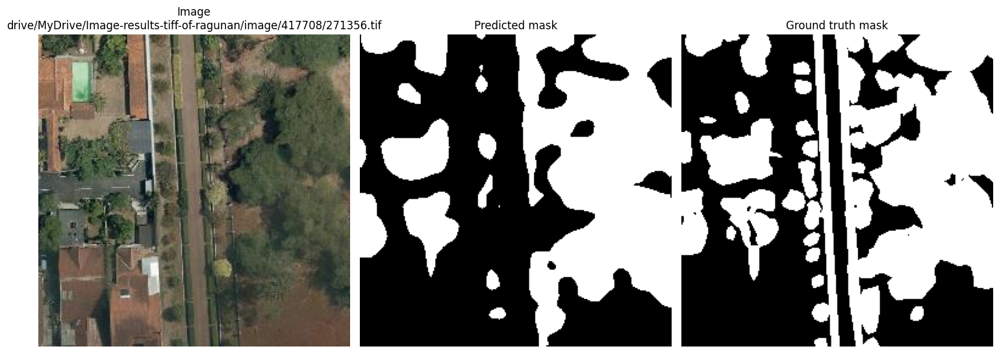

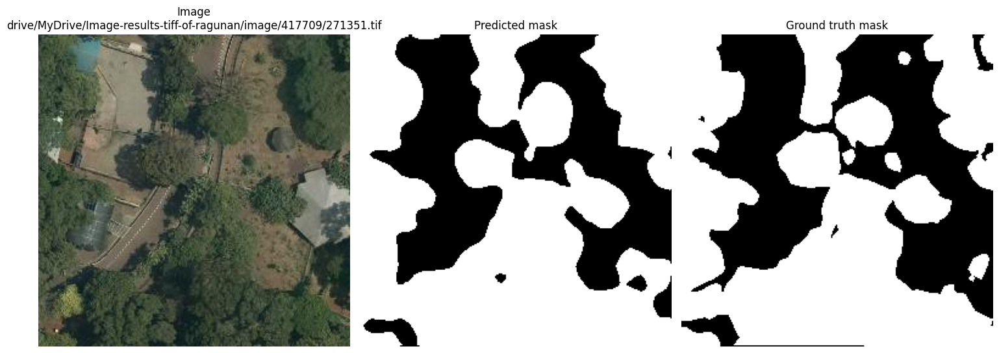

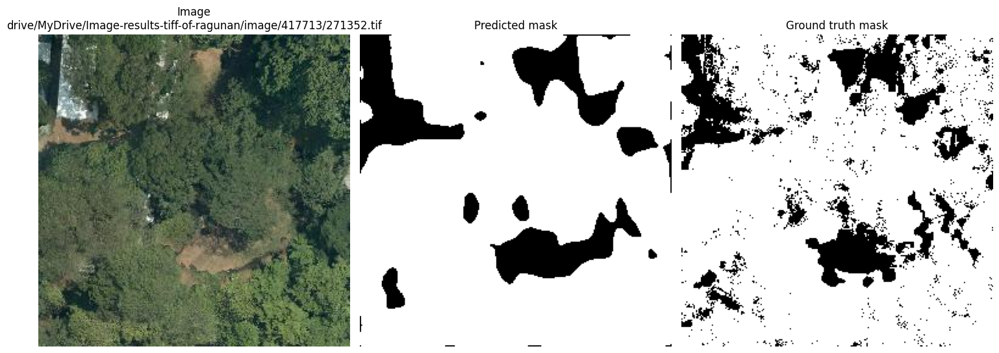

...

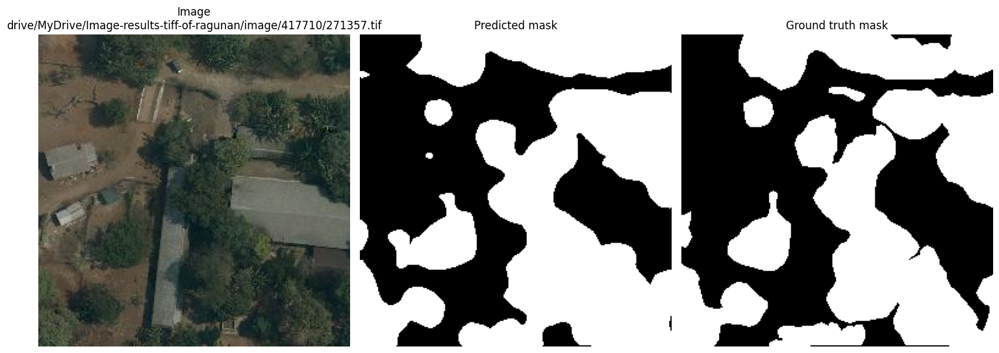

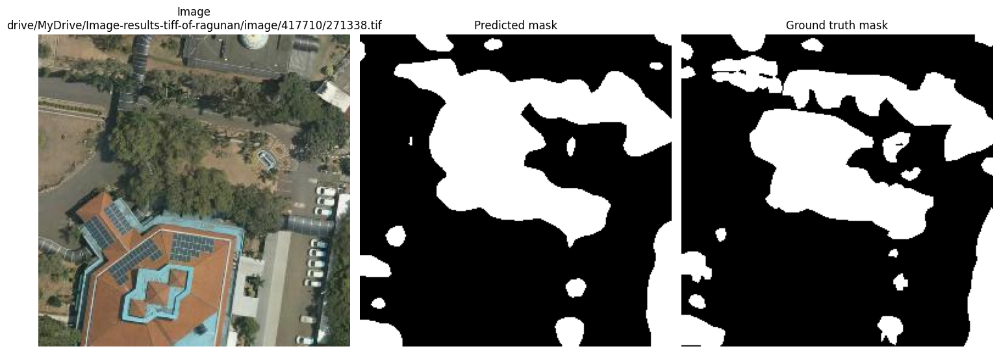

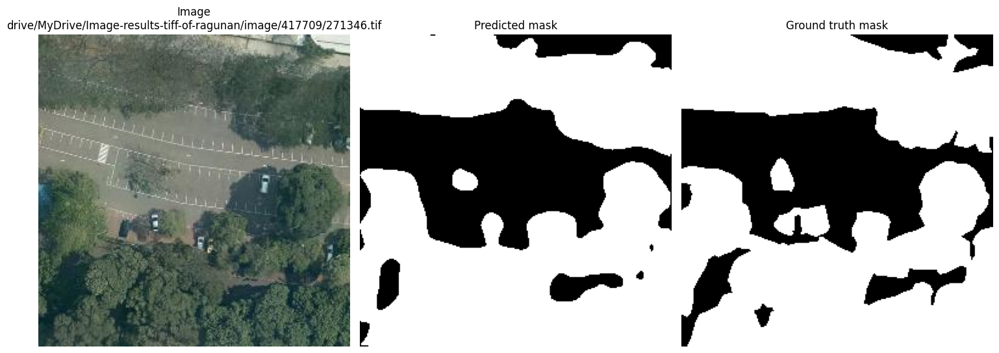

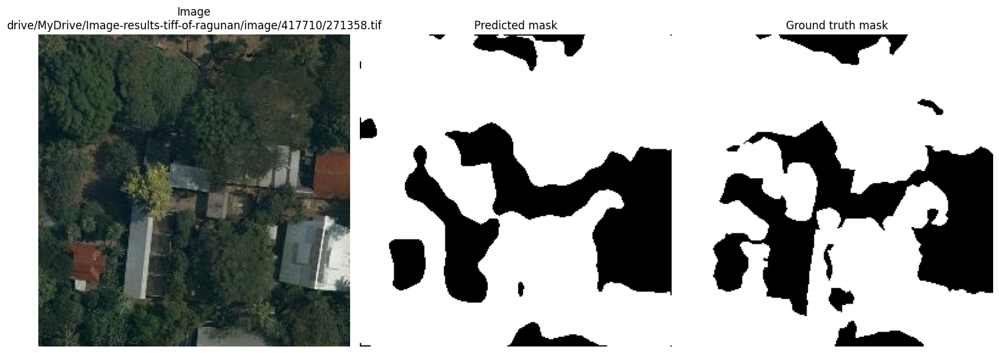

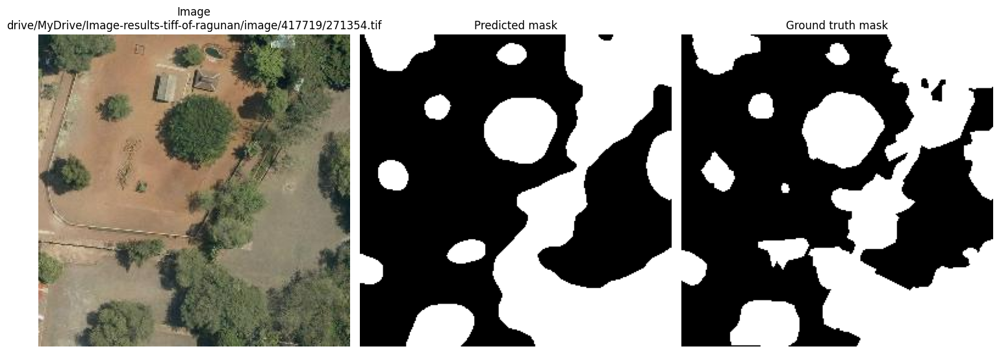

In [32]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [33]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [34]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41212
Vegetation coverage area: 23195.346372492557
IoU score: 0.8107680126682502
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 46332
Vegetation coverage area: 3600.363802671799
IoU score: 0.753844268823133
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 27892
Vegetation coverage area: 15698.451931999476
IoU score: 0.7046047164675205
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 41640
Vegetation coverage area: 23436.23757523513
IoU score: 0.8599412340842312
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 54060
Veg

In [47]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 23195.346372492557 m^2
Carbon density: 0.007117227959615049 ton/m^2
Estimated carbon stock: 165.08656773525954 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3600.363802671799 m^2
Carbon density: 0.007117227959615049 ton/m^2
Estimated carbon stock: 25.62460992116169 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 15698.451931999476 m^2
Carbon density: 0.007117227959615049 ton/m^2
Estimated carbon stock: 111.72946101309955 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 23436.23757523513 m^2
Carbon density: 0.007117227959615049 ton/m^2
Estimated carbon stock: 166.80104533864426 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4200.890684029126 m^2
Carbon density: 0.007